In [86]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score,cross_validate
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.metrics import SCORERS
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
import warnings

%matplotlib inline
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('customer_retention_dataset.csv')

In [3]:
df.head()

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,...,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer would you recommend to a friend?
0,0,3,Delhi,110009,5,4,4,3,5,1,...,Amazon.in,Amazon.in,Flipkart.com,Flipkart.com,Amazon.in,Paytm.com,Flipkart.com,Amazon.in,Amazon.in,Flipkart.com
1,1,2,Delhi,110030,5,5,2,1,2,3,...,"Amazon.in, Flipkart.com",Myntra.com,snapdeal.com,Snapdeal.com,Snapdeal.com,Snapdeal.com,Amazon.in,Myntra.com,"Amazon.in, Flipkart.com","Amazon.in, Myntra.com"
2,1,2,Greater Noida,201308,4,5,3,1,4,2,...,Myntra.com,Myntra.com,Myntra.com,Myntra.com,Amazon.in,Paytm.com,Paytm.com,Paytm.com,Amazon.in,"Amazon.in, Paytm.com, Myntra.com"
3,0,2,Karnal,132001,4,1,3,1,4,3,...,Snapdeal.com,"Myntra.com, Snapdeal.com",Myntra.com,Paytm.com,Paytm.com,Paytm.com,"Amazon.in, Flipkart.com","Amazon.in, Flipkart.com","Amazon.in, Flipkart.com, Paytm.com","Amazon.in, Flipkart.com"
4,1,2,Bangalore,530068,3,2,2,1,2,3,...,"Flipkart.com, Paytm.com",Paytm.com,Paytm.com,Paytm.com,Snapdeal.com,Paytm.com,Amazon.in,Snapdeal.com,Paytm.com,"Amazon.in, Myntra.com"


In [4]:
df.size

19099

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 71 columns):
 #   Column                                                                                                                                                                                                          Non-Null Count  Dtype 
---  ------                                                                                                                                                                                                          --------------  ----- 
 0   1Gender of respondent                                                                                                                                                                                           269 non-null    int64 
 1   2 How old are you?                                                                                                                                                                    

In [6]:
#Null Values in df
df.isna().sum()

1Gender of respondent                                                   0
2 How old are you?                                                      0
3 Which city do you shop online from?                                   0
4 What is the Pin Code of where you shop online from?                   0
5 Since How Long You are Shopping Online ?                              0
                                                                       ..
Longer delivery period                                                  0
Change in website/Application design                                    0
Frequent disruption when moving from one page to another                0
Website is as efficient as before                                       0
Which of the Indian online retailer would you recommend to a friend?    0
Length: 71, dtype: int64

In [7]:
df['Which of the Indian online retailer would you recommend to a friend?'].value_counts()

Amazon.in                                            79
Amazon.in, Flipkart.com                              62
Flipkart.com                                         39
Amazon.in, Myntra.com                                30
Amazon.in, Paytm.com, Myntra.com                     20
Amazon.in, Flipkart.com, Myntra.com                  15
Amazon.in, Paytm.com                                 13
Flipkart.com, Paytm.com, Myntra.com, snapdeal.com    11
Name: Which of the Indian online retailer would you recommend to a friend?, dtype: int64

In [8]:
df.rename(columns = {'Which of the Indian online retailer would you recommend to a friend?':'recommendation'}, inplace = True)

In [9]:
df.columns

Index(['1Gender of respondent', '2 How old are you? ',
       '3 Which city do you shop online from?',
       '4 What is the Pin Code of where you shop online from?',
       '5 Since How Long You are Shopping Online ?',
       '6 How many times you have made an online purchase in the past 1 year?',
       '7 How do you access the internet while shopping on-line?',
       '8 Which device do you use to access the online shopping?',
       '9 What is the screen size of your mobile device?\t\t\t\t\t\t                                        ',
       '10 What is the operating system (OS) of your device?\t\t\t\t                                          ',
       '11 What browser do you run on your device to access the website?\t\t\t                                                          ',
       '12 Which channel did you follow to arrive at your favorite online store for the first time?                                                                   ',
       '13 After first visit, how 

In [10]:
df.rename(columns = {'1Gender of respondent':'Gender'}, inplace = True)
df.rename(columns = {'2 How old are you? ':'Age'}, inplace = True)
df.rename(columns = {'4 What is the Pin Code of where you shop online from?':'pin'}, inplace = True)
df.rename(columns = {'3 Which city do you shop online from?':'city'}, inplace = True)
df.rename(columns = {'5 Since How Long You are Shopping Online ?':'shopping_duration'}, inplace = True)
df.rename(columns = {'6 How many times you have made an online purchase in the past 1 year?':'p_record_1y'}, inplace = True)
df.rename(columns = {'7 How do you access the internet while shopping on-line?':'internet_conn_type'}, inplace = True)
df.rename(columns = {'8 Which device do you use to access the online shopping?':'device_type'}, inplace = True)
df.rename(columns = {'9 What is the screen size of your mobile device?\t\t\t\t\t\t                                        ':'screen_size'}, inplace = True)
df.rename(columns = {'10 What is the operating system (OS) of your device?\t\t\t\t                                          ':'OS'}, inplace = True)
df.rename(columns = {'11 What browser do you run on your device to access the website?\t\t\t                                                          ':'browser'}, inplace = True)
df.rename(columns = {'12 Which channel did you follow to arrive at your favorite online store for the first time?                                                                   ':'c_f_d_ft'}, inplace = True)
df.rename(columns = {'13 After first visit, how do you reach the online retail store?\t\t\t\t                                                   ':'reach_a_ft'}, inplace = True)
df.rename(columns = {'14 How much time do you explore the e- retail store before making a purchase decision?                                                                   ':'time_spent_b4_p'}, inplace = True)
df.rename(columns = {'15 What is your preferred payment Option?\t\t\t\t\t                                                                                                                               ':'p_payment'}, inplace = True)
df.rename(columns = {'16 How 4 do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t                                                   ':'abandon_item_f'}, inplace = True)
df.rename(columns = {'17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t                                                                                                                                                       ':'reason'}, inplace = True)
df.rename(columns = {'18 The content on the website must be easy to read and understand':'ease'}, inplace = True)
df.rename(columns = {'19 Information on similar product to the one highlighted  is important for product comparison':'comparison_option'}, inplace = True)
df.rename(columns = {'20 Complete information on listed seller and product being offered is important for purchase decision.':'seller_info'}, inplace = True)
df.rename(columns = {'21 All relevant information on listed products must be stated clearly':'p_info'}, inplace = True)
df.rename(columns = {'22 Ease of navigation in website':'nav_ease'}, inplace = True)
df.rename(columns = {'23 Loading and processing speed':'speed'}, inplace = True)
df.rename(columns = {'24 User friendly Interface of the website':'user_friendly'}, inplace = True)
df.rename(columns = {'25 Convenient Payment methods':'p_m_c'}, inplace = True)
df.rename(columns = {'26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time':'trust'}, inplace = True)
df.rename(columns = {'27 Empathy (readiness to assist with queries) towards the customers':'empathy'}, inplace = True)
df.rename(columns = {'28 Being able to guarantee the privacy of the customer':'privacy_protection'}, inplace = True)
df.rename(columns = {'29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)':'availability'}, inplace = True)
df.rename(columns = {'30 Online shopping gives monetary benefit and discounts':'offers'}, inplace = True)
df.rename(columns = {'31 Enjoyment is derived from shopping online':'fun'}, inplace = True)
df.rename(columns = {'32 Shopping online is convenient and flexible':'convienience'}, inplace = True)
df.rename(columns = {'33 Return and replacement policy of the e-tailer is important for purchase decision':'return_option'}, inplace = True)
df.rename(columns = {'34 Gaining access to loyalty programs is a benefit of shopping online':'loyalty_option'}, inplace = True)
df.rename(columns = {'35 Displaying quality Information on the website improves satisfaction of customers':'info_quality'}, inplace = True)
df.rename(columns = {'36 User derive satisfaction while shopping on a good quality website or application':''}, inplace = True)
df.rename(columns = {'37 Net Benefit derived from shopping online can lead to users satisfaction':'nb_corr_us'}, inplace = True)
df.rename(columns = {'38 User satisfaction cannot exist without trust':'us_corr_trust'}, inplace = True)
df.rename(columns = {'39 Offering a wide variety of listed product in several category':'prod_variety'}, inplace = True)
df.rename(columns = {'40 Provision of complete and relevant product information':'info_reliability'}, inplace = True)
df.rename(columns = {'41 Monetary savings':'monetary_savings'}, inplace = True)
df.rename(columns = {'42 The Convenience of patronizing the online retailer':'p_conv'}, inplace = True)


In [11]:
df.columns

Index(['Gender', 'Age', 'city', 'pin', 'shopping_duration', 'p_record_1y',
       'internet_conn_type', 'device_type', 'screen_size', 'OS', 'browser',
       'c_f_d_ft', 'reach_a_ft', 'time_spent_b4_p', 'p_payment',
       'abandon_item_f', 'reason', 'ease', 'comparison_option', 'seller_info',
       'p_info', 'nav_ease', 'speed', 'user_friendly', 'p_m_c', 'trust',
       'empathy', 'privacy_protection', 'availability', 'offers', 'fun',
       'convienience', 'return_option', 'loyalty_option', 'info_quality', '',
       'nb_corr_us', 'us_corr_trust', 'prod_variety', 'info_reliability',
       'monetary_savings', 'p_conv',
       '43 Shopping on the website gives you the sense of adventure',
       '44 Shopping on your preferred e-tailer enhances your social status',
       '45 You feel gratification shopping on your favorite e-tailer',
       '46 Shopping on the website helps you fulfill certain roles',
       '47 Getting value for money spent',
       'From the following, tick any (or

In [12]:
# split for convenience
df.rename(columns = {'43 Shopping on the website gives you the sense of adventure':'adv_sentiment'}, inplace = True)
df.rename(columns = {'44 Shopping on your preferred e-tailer enhances your social status':'ss_sentiment'}, inplace = True)
df.rename(columns = {'45 You feel gratification shopping on your favorite e-tailer':'grat_sentiment'}, inplace = True)
df.rename(columns = {'46 Shopping on the website helps you fulfill certain roles':'role_sentiment'}, inplace = True)
df.rename(columns = {'47 Getting value for money spent':'cost_vs_val'}, inplace = True)
df.rename(columns = {'From the following, tick any (or all) of the online retailers you have shopped from;                                                                           ':'p_history'}, inplace = True)
df.rename(columns = {'Easy to use website or application':'ease_2'}, inplace = True)
df.rename(columns = {'Visual appealing web-page layout':'visual_appeal'}, inplace = True)
df.rename(columns = {'Complete, relevant description information of products':'completeness_info'}, inplace = True)
df.rename(columns = {'Fast loading website speed of website and application':'speed_2'}, inplace = True)
df.rename(columns = {'Reliability of the website or application':'reliability_2'}, inplace = True)
df.rename(columns = {'Quickness to complete purchase':'purchase_speed'}, inplace = True)
df.rename(columns = {'Availability of several payment options':'p_o_availability'}, inplace = True)
df.rename(columns = {'Speedy order delivery ':'d_speed'}, inplace = True)
df.rename(columns = {'Privacy of customers’ information':'c_p'}, inplace = True)
df.rename(columns = {'Security of customer financial information':'f_info_p'}, inplace = True)
df.rename(columns = {'Presence of online assistance through multi-channel':'multi-channel_o_a'}, inplace = True)
df.rename(columns = {'Longer time to get logged in (promotion, sales period)':'login_speed'}, inplace = True)
df.rename(columns = {'Longer time in displaying graphics and photos (promotion, sales period)':'media_load_speed'}, inplace = True)
df.rename(columns = {'Late declaration of price (promotion, sales period)':'l_p_d'}, inplace = True)
df.rename(columns = {'Longer page loading time (promotion, sales period)':'page_load_speed'}, inplace = True)
df.rename(columns = {'Limited mode of payment on most products (promotion, sales period)':'l_p_mode'}, inplace = True)
df.rename(columns = {'Longer delivery period':'l_del_period'}, inplace = True)
df.rename(columns = {'Change in website/Application design':'UI_change'}, inplace = True)
df.rename(columns = {'Frequent disruption when moving from one page to another':'disruptions'}, inplace = True)
df.rename(columns = {'Website is as efficient as before':'efficiency_comparison'}, inplace = True)
df.rename(columns = {'Wild variety of product on offer':'offer_v'}, inplace = True)
df.rename(columns = {'Perceived Trustworthiness':'percieved_trust'}, inplace = True)

In [13]:
df.columns

Index(['Gender', 'Age', 'city', 'pin', 'shopping_duration', 'p_record_1y',
       'internet_conn_type', 'device_type', 'screen_size', 'OS', 'browser',
       'c_f_d_ft', 'reach_a_ft', 'time_spent_b4_p', 'p_payment',
       'abandon_item_f', 'reason', 'ease', 'comparison_option', 'seller_info',
       'p_info', 'nav_ease', 'speed', 'user_friendly', 'p_m_c', 'trust',
       'empathy', 'privacy_protection', 'availability', 'offers', 'fun',
       'convienience', 'return_option', 'loyalty_option', 'info_quality', '',
       'nb_corr_us', 'us_corr_trust', 'prod_variety', 'info_reliability',
       'monetary_savings', 'p_conv', 'adv_sentiment', 'ss_sentiment',
       'grat_sentiment', 'role_sentiment', 'cost_vs_val', 'p_history',
       'ease_2', 'visual_appeal', 'offer_v', 'completeness_info', 'speed_2',
       'reliability_2', 'purchase_speed', 'p_o_availability', 'd_speed', 'c_p',
       'f_info_p', 'percieved_trust', 'multi-channel_o_a', 'login_speed',
       'media_load_speed', 'l_p_d',

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 71 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Gender                 269 non-null    int64 
 1   Age                    269 non-null    int64 
 2   city                   269 non-null    object
 3   pin                    269 non-null    int64 
 4   shopping_duration      269 non-null    int64 
 5   p_record_1y            269 non-null    int64 
 6   internet_conn_type     269 non-null    int64 
 7   device_type            269 non-null    int64 
 8   screen_size            269 non-null    int64 
 9   OS                     269 non-null    int64 
 10  browser                269 non-null    int64 
 11  c_f_d_ft               269 non-null    int64 
 12  reach_a_ft             269 non-null    int64 
 13  time_spent_b4_p        269 non-null    int64 
 14  p_payment              269 non-null    int64 
 15  abandon_item_f         

In [15]:
df.describe()

,Gender,Age,pin,shopping_duration,p_record_1y,internet_conn_type,device_type,screen_size,OS,browser,...,us_corr_trust,prod_variety,info_reliability,monetary_savings,p_conv,adv_sentiment,ss_sentiment,grat_sentiment,role_sentiment,cost_vs_val
count,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,...,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000
mean,0.669145,2.959108,220465.747212,3.524164,2.672862,3.260223,1.676580,4.282528,1.776952,1.275093,...,4.182156,4.148699,4.349442,4.263941,3.914498,3.553903,3.223048,3.501859,3.282528,4.163569
std,0.471398,1.066012,140524.341051,1.436586,1.651788,1.135887,0.843904,0.923426,0.797892,0.645429,...,1.072162,0.842110,0.755953,1.000485,0.693879,1.065869,1.219581,1.141564,1.178995,0.648773
min,0.000000,1.000000,110008.000000,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,1.000000,...,1.000000,2.000000,2.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,3.000000
25%,0.000000,2.000000,122018.000000,3.000000,1.000000,2.000000,1.000000,4.000000,1.000000,1.000000,...,4.000000,4.000000,4.000000,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000
50%,1.000000,3.000000,201303.000000,4.000000,2.000000,3.000000,1.000000,4.000000,2.000000,1.000000,...,4.000000,4.000000,5.000000,5.000000,4.000000,4.000000,3.000000,3.000000,3.000000,4.000000
75%,1.000000,4.000000,201310.000000,5.000000,4.000000,5.000000,2.000000,5.000000,2.000000,1.000000,...,5.000000,5.000000,5.000000,5.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000
max,1.000000,5.000000,560037.000000,5.000000,5.000000,5.000000,4.000000,5.000000,3.000000,4.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [16]:
# Unique values in all columns
for column in df.columns:
        print(str(column)+" : " +str(df[column].unique()))

Gender : [0 1]
Age : [3 2 4 1 5]
city : ['Delhi' 'Greater Noida' 'Karnal ' 'Bangalore ' 'Noida' 'Solan'
 'Moradabad' 'Gurgaon ' 'Merrut' 'Ghaziabad' 'Bulandshahr']
pin : [110009 110030 201308 132001 530068 110011 110018 173229 110039 244001
 122018 201310 560037 203207 250001 201005 110044 201306 560010 201305
 110042 132036 560018 110008 560002 201303 201312 203202 560001 201304
 560003 110014 560013 173212 122009 201009 201008 201001 203001]
shopping_duration : [5 4 3 1 2]
p_record_1y : [4 5 1 2 3]
internet_conn_type : [4 2 3 5]
device_type : [3 1 4 2]
screen_size : [5 2 4]
OS : [1 3 2]
browser : [1 2 4 3]
c_f_d_ft : [1 3 4]
reach_a_ft : [1 4 3 2]
time_spent_b4_p : [3 5 4 2 1]
p_payment : [4 1 2]
abandon_item_f : [3 5 1 4]
reason : [3 5 2 1 4]
ease : [4 5 1 3]
comparison_option : [3 5 4 2]
seller_info : [3 5 4 2 1]
p_info : [4 5 1 2]
nav_ease : [4 5 1 2]
speed : [1 5 4 2 3]
user_friendly : [2 5 4 1 3]
p_m_c : [2 5 4]
trust : [2 5 4 3]
empathy : [5 4 1 3]
privacy_protection : [4 5 3]


In [17]:
# Value_counts
for column in df.columns:        
    print(df[column].value_counts())

1    180
0     89
Name: Gender, dtype: int64
3    81
2    79
4    70
1    20
5    19
Name: Age, dtype: int64
Delhi            58
Greater Noida    43
Noida            40
Bangalore        37
Karnal           27
Solan            18
Ghaziabad        18
Gurgaon          12
Merrut            9
Moradabad         5
Bulandshahr       2
Name: city, dtype: int64
201308    38
132001    19
201310    18
110044    16
250001     9
173229     9
173212     9
560010     8
132036     8
122018     8
560037     8
110008     7
110011     7
201306     7
110014     6
110018     6
201305     5
201008     5
201009     5
201312     5
244001     5
530068     5
122009     4
201001     4
560003     4
201304     4
110009     4
201303     4
560002     4
560018     4
110042     4
110030     4
201005     4
110039     4
560013     3
203001     2
203202     1
560001     1
203207     1
Name: pin, dtype: int64
5    98
3    65
4    47
1    43
2    16
Name: shopping_duration, dtype: int64
1    114
4     63
5     53
2     29
3

In [18]:
df.columns

Index(['Gender', 'Age', 'city', 'pin', 'shopping_duration', 'p_record_1y',
       'internet_conn_type', 'device_type', 'screen_size', 'OS', 'browser',
       'c_f_d_ft', 'reach_a_ft', 'time_spent_b4_p', 'p_payment',
       'abandon_item_f', 'reason', 'ease', 'comparison_option', 'seller_info',
       'p_info', 'nav_ease', 'speed', 'user_friendly', 'p_m_c', 'trust',
       'empathy', 'privacy_protection', 'availability', 'offers', 'fun',
       'convienience', 'return_option', 'loyalty_option', 'info_quality', '',
       'nb_corr_us', 'us_corr_trust', 'prod_variety', 'info_reliability',
       'monetary_savings', 'p_conv', 'adv_sentiment', 'ss_sentiment',
       'grat_sentiment', 'role_sentiment', 'cost_vs_val', 'p_history',
       'ease_2', 'visual_appeal', 'offer_v', 'completeness_info', 'speed_2',
       'reliability_2', 'purchase_speed', 'p_o_availability', 'd_speed', 'c_p',
       'f_info_p', 'percieved_trust', 'multi-channel_o_a', 'login_speed',
       'media_load_speed', 'l_p_d',

(array([ 89.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 180.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

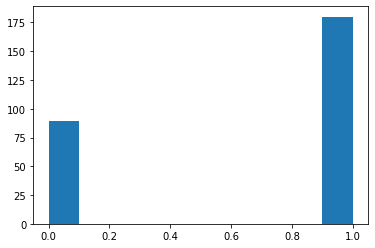

In [19]:
# Distribution of Gender
plt.hist(df['Gender'])

<AxesSubplot:xlabel='Age'>

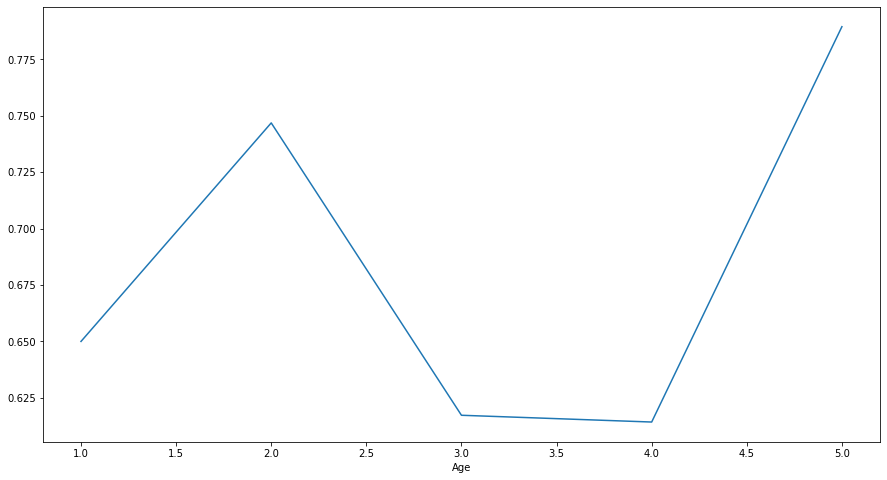

In [20]:
# Relation of Gender vs Age
D=df.groupby('Age').mean()
plt.figure(figsize=(15,8))
D['Gender'].plot()

<AxesSubplot:xlabel='city'>

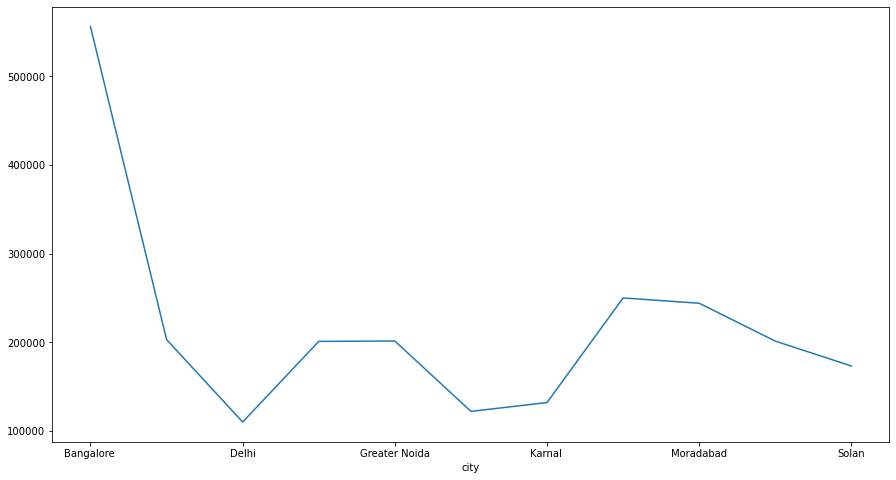

In [21]:
# Relation of City vs pin
D=df.groupby('city').mean()
plt.figure(figsize=(15,8))
D['pin'].plot()

<AxesSubplot:xlabel='device_type'>

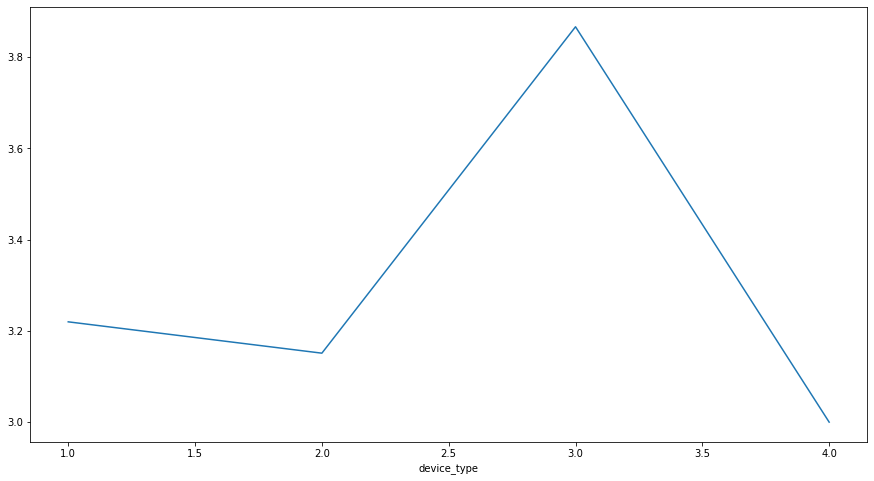

In [22]:
# Relation of device type and internet connection
D=df.groupby('device_type').mean()
plt.figure(figsize=(15,8))
D['internet_conn_type'].plot()

<AxesSubplot:xlabel='screen_size'>

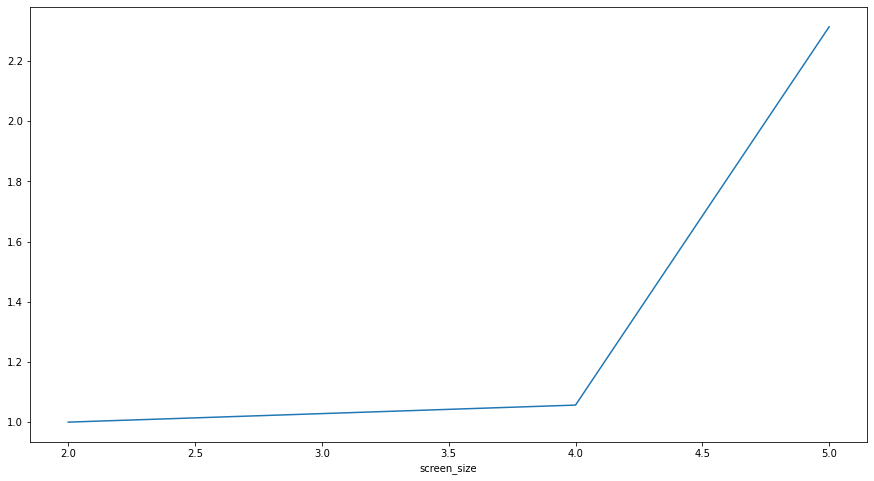

In [23]:
# Relation of device type and internet connection
D=df.groupby('screen_size').mean()
plt.figure(figsize=(15,8))
D['device_type'].plot()

<AxesSubplot:xlabel='offers'>

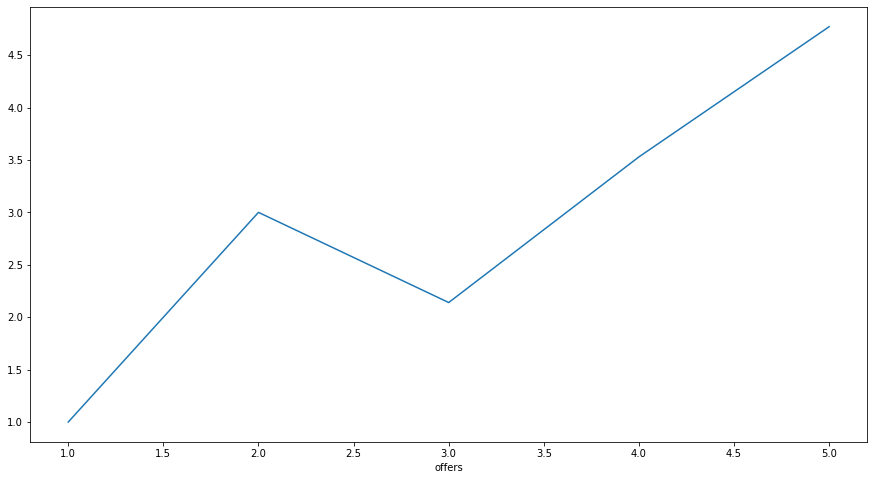

In [24]:
# Relation of offers and fun
D=df.groupby('offers').mean()
plt.figure(figsize=(15,8))
D['fun'].plot()

In [25]:
df.columns

Index(['Gender', 'Age', 'city', 'pin', 'shopping_duration', 'p_record_1y',
       'internet_conn_type', 'device_type', 'screen_size', 'OS', 'browser',
       'c_f_d_ft', 'reach_a_ft', 'time_spent_b4_p', 'p_payment',
       'abandon_item_f', 'reason', 'ease', 'comparison_option', 'seller_info',
       'p_info', 'nav_ease', 'speed', 'user_friendly', 'p_m_c', 'trust',
       'empathy', 'privacy_protection', 'availability', 'offers', 'fun',
       'convienience', 'return_option', 'loyalty_option', 'info_quality', '',
       'nb_corr_us', 'us_corr_trust', 'prod_variety', 'info_reliability',
       'monetary_savings', 'p_conv', 'adv_sentiment', 'ss_sentiment',
       'grat_sentiment', 'role_sentiment', 'cost_vs_val', 'p_history',
       'ease_2', 'visual_appeal', 'offer_v', 'completeness_info', 'speed_2',
       'reliability_2', 'purchase_speed', 'p_o_availability', 'd_speed', 'c_p',
       'f_info_p', 'percieved_trust', 'multi-channel_o_a', 'login_speed',
       'media_load_speed', 'l_p_d',

<AxesSubplot:xlabel='nav_ease'>

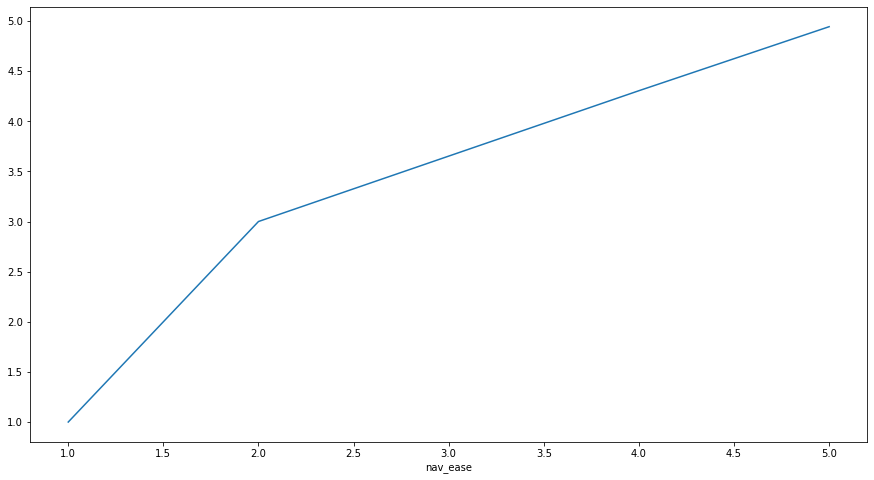

In [26]:
# Relation of nav_ease vs user_friendly
D=df.groupby('nav_ease').mean()
plt.figure(figsize=(15,8))
D['user_friendly'].plot()

<AxesSubplot:xlabel='ease'>

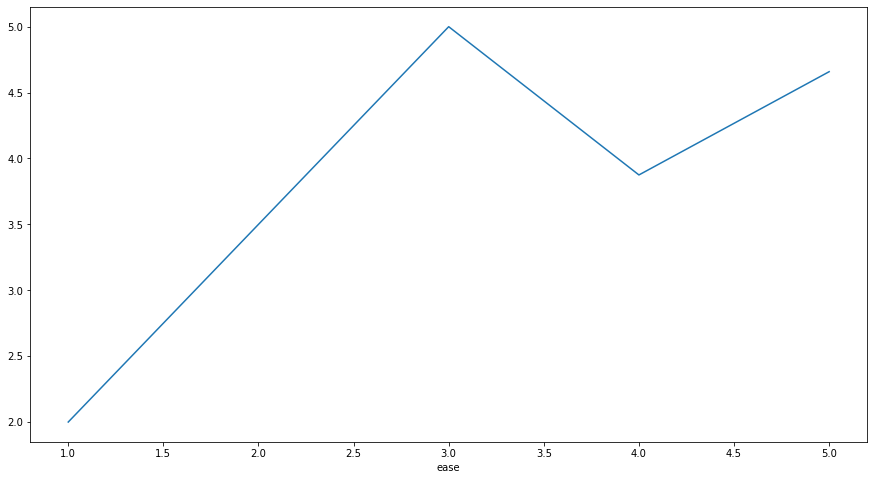

In [27]:
# Relation of ease vs trust
D=df.groupby('ease').mean()
plt.figure(figsize=(15,8))
D['trust'].plot()

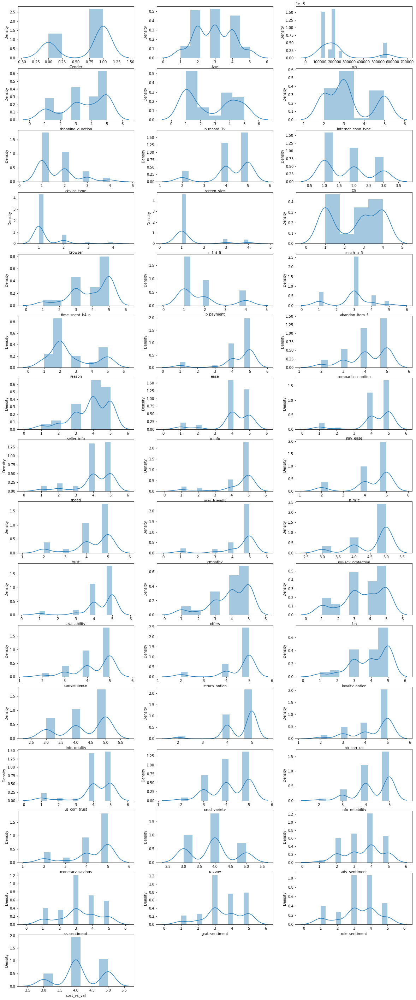

In [28]:
#Distribution of numerical columns in df
plt.figure(figsize=(20,80),facecolor='white')
plotnumber=1
for i in df:
    if df[i].dtype != 'object':
        if plotnumber<=75:
            ax=plt.subplot(25,3,plotnumber)
            sns.distplot(df[i])
            plt.xlabel(i)
        plotnumber+=1

In [29]:
df.skew()

Gender               -0.723007
Age                   0.063243
pin                   1.748322
shopping_duration    -0.554705
p_record_1y           0.227755
internet_conn_type    0.567694
device_type           1.121438
screen_size          -1.421577
OS                    0.422971
browser               2.772060
c_f_d_ft              2.216567
reach_a_ft           -0.155470
time_spent_b4_p      -0.824197
p_payment             1.232529
abandon_item_f       -0.451429
reason                0.750037
ease                 -2.234127
comparison_option    -0.801079
seller_info          -0.893446
p_info               -1.710957
nav_ease             -2.052560
speed                -1.467621
user_friendly        -2.015996
p_m_c                -1.581400
trust                -1.261484
empathy              -2.294982
privacy_protection   -1.355737
availability         -2.104016
offers               -1.052475
fun                  -0.565041
convienience         -1.121619
return_option        -2.243625
loyalty_

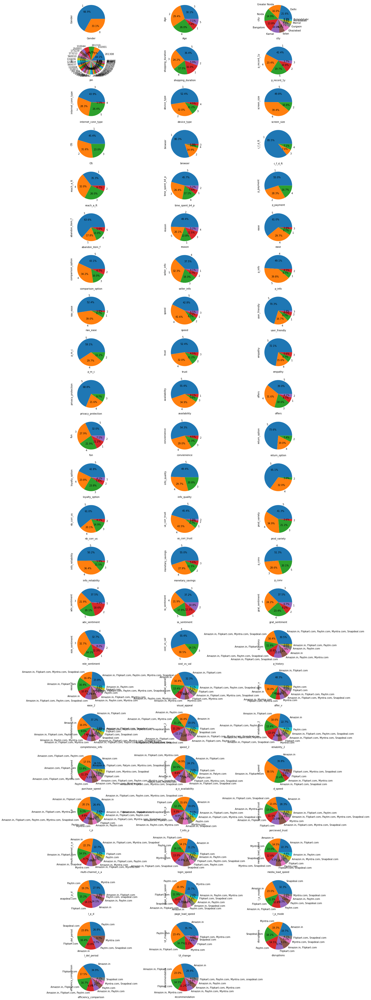

In [30]:
plt.figure(figsize=(20,80),facecolor='white')
plotnumber=1
for i in df:
        if plotnumber<=75:
            ax=plt.subplot(25,3,plotnumber)
            df[i].value_counts().plot.pie(autopct = '%.1f%%')
            plt.xlabel(i)
        plotnumber+=1
plt.savefig('Value_distributions')

In [31]:
df['recommendation'].value_counts()

Amazon.in                                            79
Amazon.in, Flipkart.com                              62
Flipkart.com                                         39
Amazon.in, Myntra.com                                30
Amazon.in, Paytm.com, Myntra.com                     20
Amazon.in, Flipkart.com, Myntra.com                  15
Amazon.in, Paytm.com                                 13
Flipkart.com, Paytm.com, Myntra.com, snapdeal.com    11
Name: recommendation, dtype: int64

In [32]:
#splitting Target column
amazon=df['recommendation'].str.contains(pat = 'Amazon.in')
flipkart = df['recommendation'].str.contains(pat = 'Flipkart.com')
Myntra = df['recommendation'].str.contains(pat = 'Myntra.com')
paytm = df['recommendation'].str.contains(pat = 'Paytm.com')
sd = df['recommendation'].str.contains(pat = 'snapdeal.com')

In [33]:
# adding separated recommendation 
df['Amazon_r'] = amazon
df['Flipkart_r'] = flipkart
df['Myntra_r'] = Myntra
df['Paytm_r'] = paytm
df['Snapdeal_r'] = sd

In [34]:
#splitting p_history column
amazon=df['p_history'].str.contains(pat = 'Amazon.in')
flipkart = df['p_history'].str.contains(pat = 'Flipkart.com')
Myntra = df['p_history'].str.contains(pat = 'Myntra.com')
paytm = df['p_history'].str.contains(pat = 'Paytm.com')
sd = df['p_history'].str.contains(pat = 'snapdeal.com')

In [35]:
# adding separated column
df['Amazon_ph'] = amazon
df['Flipkart_ph'] = flipkart
df['Myntra_ph'] = Myntra
df['Paytm_ph'] = paytm
df['Snapdeal_ph'] = sd

In [36]:
# automating the process
col_l = ['offer_v','visual_appeal','ease_2','completeness_info', 'speed_2','reliability_2', 'purchase_speed', 'p_o_availability', 'd_speed', 'c_p','f_info_p', 'percieved_trust', 'multi-channel_o_a', 'login_speed','media_load_speed', 'l_p_d', 'page_load_speed', 'l_p_mode','l_del_period', 'UI_change', 'disruptions', 'efficiency_comparison']
for i in col_l:
    amazon=df[i].str.contains(pat = 'Amazon.in')
    flipkart = df[i].str.contains(pat = 'Flipkart.com')
    Myntra = df[i].str.contains(pat = 'Myntra.com')
    paytm = df[i].str.contains(pat = 'Paytm.com')
    sd = df[i].str.contains(pat = 'snapdeal.com')
    
    df['Amazon_' +str(i)] = amazon
    df['Flipkart_' +str(i)] = flipkart
    df['Myntra_' +str(i)] = Myntra
    df['Paytm_' +str(i)] = paytm
    df['Snapdeal_' +str(i)] = sd
    

In [37]:
df.shape

(269, 191)

In [38]:
# dropping aggregate rows
df.drop(columns=col_l,inplace=True)
df.drop(columns=['recommendation','p_history'],inplace=True)

In [39]:
df.shape

(269, 167)

In [40]:
df.head(10)

,Gender,Age,city,pin,shopping_duration,p_record_1y,internet_conn_type,device_type,screen_size,OS,...,Amazon_disruptions,Flipkart_disruptions,Myntra_disruptions,Paytm_disruptions,Snapdeal_disruptions,Amazon_efficiency_comparison,Flipkart_efficiency_comparison,Myntra_efficiency_comparison,Paytm_efficiency_comparison,Snapdeal_efficiency_comparison
0,0,3,Delhi,110009,5,4,4,3,5,1,...,True,False,False,False,False,True,False,False,False,False
1,1,2,Delhi,110030,5,5,2,1,2,3,...,False,False,True,False,False,True,True,False,False,False
2,1,2,Greater Noida,201308,4,5,3,1,4,2,...,False,False,False,True,False,True,False,False,False,False
3,0,2,Karnal,132001,4,1,3,1,4,3,...,True,True,False,False,False,True,True,False,True,False
4,1,2,Bangalore,530068,3,2,2,1,2,3,...,False,False,False,False,False,False,False,False,True,False
5,1,3,Noida,201308,5,5,2,1,4,2,...,False,True,False,False,False,True,False,False,False,False
6,0,4,Delhi,110011,5,4,2,4,5,2,...,False,False,True,False,False,False,False,False,False,False
7,0,4,Delhi,110018,4,1,3,3,5,1,...,True,False,False,False,False,True,False,False,False,False
8,1,1,Solan,173229,3,1,2,1,4,2,...,False,False,True,False,False,False,False,True,False,False
9,1,3,Delhi,110039,1,1,2,2,5,1,...,False,False,True,False,False,False,True,False,False,False


In [41]:
# # <<<<<<<<<< Need to use encoder to encode non-numerical features to numerical features >>>>>>>>>>>>>
for col in df.columns:
    if df[col].dtypes=='object' or df[col].dtypes=='bool' :
        encoder=LabelEncoder()
        df[col]=encoder.fit_transform(df[col])

In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Columns: 167 entries, Gender to Snapdeal_efficiency_comparison
dtypes: int64(167)
memory usage: 351.1 KB


 - we can see that there are no more columns of dtype object

In [43]:
df.head()

,Gender,Age,city,pin,shopping_duration,p_record_1y,internet_conn_type,device_type,screen_size,OS,...,Amazon_disruptions,Flipkart_disruptions,Myntra_disruptions,Paytm_disruptions,Snapdeal_disruptions,Amazon_efficiency_comparison,Flipkart_efficiency_comparison,Myntra_efficiency_comparison,Paytm_efficiency_comparison,Snapdeal_efficiency_comparison
0,0,3,2,110009,5,4,4,3,5,1,...,1,0,0,0,0,1,0,0,0,0
1,1,2,2,110030,5,5,2,1,2,3,...,0,0,1,0,0,1,1,0,0,0
2,1,2,4,201308,4,5,3,1,4,2,...,0,0,0,1,0,1,0,0,0,0
3,0,2,6,132001,4,1,3,1,4,3,...,1,1,0,0,0,1,1,0,1,0
4,1,2,0,530068,3,2,2,1,2,3,...,0,0,0,0,0,0,0,0,1,0


In [44]:
for i in df.columns:
    print(df[i].value_counts())

1    180
0     89
Name: Gender, dtype: int64
3    81
2    79
4    70
1    20
5    19
Name: Age, dtype: int64
2     58
4     43
9     40
0     37
6     27
10    18
3     18
5     12
7      9
8      5
1      2
Name: city, dtype: int64
201308    38
132001    19
201310    18
110044    16
250001     9
173229     9
173212     9
560010     8
132036     8
122018     8
560037     8
110008     7
110011     7
201306     7
110014     6
110018     6
201305     5
201008     5
201009     5
201312     5
244001     5
530068     5
122009     4
201001     4
560003     4
201304     4
110009     4
201303     4
560002     4
560018     4
110042     4
110030     4
201005     4
110039     4
560013     3
203001     2
203202     1
560001     1
203207     1
Name: pin, dtype: int64
5    98
3    65
4    47
1    43
2    16
Name: shopping_duration, dtype: int64
1    114
4     63
5     53
2     29
3     10
Name: p_record_1y, dtype: int64
3    118
2     76
5     71
4      4
Name: internet_conn_type, dtype: int64
1    1

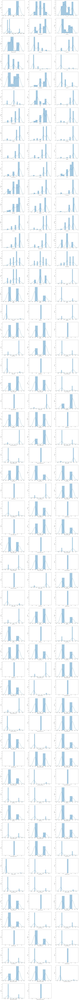

In [45]:
#Distribution of the df
plt.figure(figsize=(30,500),facecolor='white')
plotnumber=1
for i in df:
    if plotnumber<=200:
        ax=plt.subplot(70,3,plotnumber)
        sns.distplot(df[i])
        plt.xlabel(i)
    plotnumber+=1

In [46]:
# Correlation plot of columns in df
df_corr=df.corr().abs()
plt.figure(figsize=(200,200))
sns.heatmap(df_corr,annot=True,square=True,fmt='.1g',linewidth=1)
plt.savefig('Corr.png')

In [50]:
#Removing outliers using zscore
z=np.abs(stats.zscore(df))
np.where(z>4)

(array([  6,   8,  18,  22,  37,  39,  51,  54,  81,  82,  83,  89,  97,
        103, 104, 109, 118, 124, 125, 130, 135, 140, 154, 155, 180, 182,
        191, 197, 198, 201, 203, 205, 206, 229, 240, 241, 251, 253, 264,
        267]),
 array([ 51, 164,  51, 164,  51, 164,  51, 164, 164,  10, 144,  51, 164,
         10, 144,  51, 164,  10, 144,  51, 164,  51, 144, 144, 164,  10,
         51, 164,  10, 164,  10, 164,  10,  51, 144, 144, 164,  51,  10,
        164]))

In [51]:
df.shape

(269, 167)

In [52]:
# Dropping rows where z>3
index=(np.where(z>4)[0])
df=df.drop(df.index[index])

In [53]:
df.shape

(229, 167)

 - 269-229 = 40 rows dropped || (40*100)/269 = 14.86% data loss

In [83]:
# separating target and features
x=df.drop(columns=['Amazon_r','Flipkart_r','Myntra_r','Paytm_r','Snapdeal_r'],axis=1)
y=df[['Amazon_r','Flipkart_r','Myntra_r','Paytm_r','Snapdeal_r']]

In [73]:
x.shape

(229, 162)

In [74]:
y.shape

(229, 5)

In [87]:
power = PowerTransformer(method='yeo-johnson', standardize=True)
data_new = power.fit_transform(x)

In [88]:
# Skew values after treatment
data_new=pd.DataFrame(data_new,columns=x.columns)
data_new.skew()

Gender                           -0.804752
Age                              -0.036046
city                             -0.129074
pin                               0.000000
shopping_duration                -0.360644
                                    ...   
Amazon_efficiency_comparison     -1.038711
Flipkart_efficiency_comparison   -0.043967
Myntra_efficiency_comparison      0.000000
Paytm_efficiency_comparison       1.341739
Snapdeal_efficiency_comparison    0.000000
Length: 162, dtype: float64

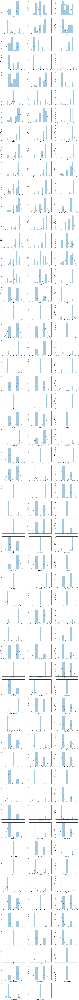

In [89]:
#Distribution of the df
plt.figure(figsize=(30,500),facecolor='white')
plotnumber=1
for i in df:
    if plotnumber<=200:
        ax=plt.subplot(70,3,plotnumber)
        sns.distplot(df[i])
        plt.xlabel(i)
    plotnumber+=1

In [90]:
x = data_new

## Model

In [93]:
import GPUtil
GPUtil.showUtilization()

| ID | GPU | MEM |
------------------
|  0 |  3% |  2% |


In [95]:
# Finding best random state
min_squared_error = 0
max_random_state = 1
for i in range(1,200):
    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=i)
    model=ElasticNet()
    model.fit(X_train,y_train)
    pred= model.predict(X_test)
    root_mean_squared_error=np.sqrt(mean_squared_error(y_test,pred))
    if root_mean_squared_error<min_squared_error:
        min_squared_error=root_mean_squared_error
        max_random_state=i
        
print('lowest error is: ',min_squared_error,' on random_state ',max_random_state)

lowest error is:  0  on random_state  1


In [105]:
# List of regressors and scorers

en = ElasticNet()
dtr = DecisionTreeRegressor(random_state=1,max_depth=3)
rfr = RandomForestRegressor(random_state=1)


m_list= [en,dtr,rfr]

s=SCORERS
s.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'top_k_accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_wei

In [106]:
# Splitting into training and testing data
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=1)

In [107]:
# Training models and getting CV score
for m in m_list:
    m.fit(X_train,y_train)
    preds = m.predict(X_test)
    rmse= np.sqrt(mean_squared_error(y_test,preds))
    print(m)
    print('Root_mean_squared_error: ',rmse)
    print('cross validation scores below:--  \n',m)
    print('root_mean_squared_error: ',cross_val_score(m,x,y,cv=5,scoring='neg_root_mean_squared_error').mean())
    print('difference between model score and cross validation score: ',-rmse-cross_val_score(m,x,y,cv=5,scoring='neg_root_mean_squared_error').mean())
    print('\n')
    print('\n')

ElasticNet()
Root_mean_squared_error:  0.3865730602705447
cross validation scores below:--  
 ElasticNet()
root_mean_squared_error:  -0.33597175829788295
difference between model score and cross validation score:  -0.05060130197266177




DecisionTreeRegressor(max_depth=3, random_state=1)
Root_mean_squared_error:  0.1088617151867933
cross validation scores below:--  
 DecisionTreeRegressor(max_depth=3, random_state=1)
root_mean_squared_error:  -0.10338034809267685
difference between model score and cross validation score:  -0.005481367094116452




RandomForestRegressor(random_state=1)
Root_mean_squared_error:  0.010907131485472218
cross validation scores below:--  
 RandomForestRegressor(random_state=1)
root_mean_squared_error:  -0.002272797835477087
difference between model score and cross validation score:  -0.008634333649995132






## Hyper-Parameter Tuning (HPT)

In [118]:
# Parameter Grid
grid_param = {'criterion':['mse','friedman_mse','mae','poisson'],
              'splitter': ['best','random'],
              'max_features': ['auto','sqrt','log2'],
              'min_samples_leaf':range(1,100,3),
              'max_leaf_nodes':range(1,100,3),
              'max_depth':range(1,3)}

In [119]:
grid_search=GridSearchCV(DecisionTreeRegressor(random_state=1),param_grid=grid_param,cv=5,n_jobs=15,verbose = 1)
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 52272 candidates, totalling 261360 fits


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=1), n_jobs=15,
             param_grid={'criterion': ['mse', 'friedman_mse', 'mae', 'poisson'],
                         'max_depth': range(1, 3),
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'max_leaf_nodes': range(1, 100, 3),
                         'min_samples_leaf': range(1, 100, 3),
                         'splitter': ['best', 'random']},
             verbose=1)

In [120]:
# Best Parameters
grid_search.best_params_

{'criterion': 'mse',
 'max_depth': 2,
 'max_features': 'auto',
 'max_leaf_nodes': 4,
 'min_samples_leaf': 1,
 'splitter': 'best'}

In [122]:
# Fitting model with best params
m = DecisionTreeRegressor(random_state=1,criterion = 'mse',splitter='best',max_features='auto',min_samples_leaf=1,max_leaf_nodes=4,max_depth=2)
m.fit(X_train,y_train)
preds = m.predict(X_test)
rmse= np.sqrt(mean_squared_error(y_test,preds))
print(m)
print('Root_mean_squared_error: ',rmse)
print('cross validation scores below:--  \n',m)
print('root_mean_squared_error: ',cross_val_score(m,x,y,cv=5,scoring='neg_root_mean_squared_error').mean())
print('difference between model score and cross validation score: ',-rmse-cross_val_score(m,x,y,cv=5,scoring='neg_root_mean_squared_error').mean())

DecisionTreeRegressor(max_depth=2, max_features='auto', max_leaf_nodes=4,
                      random_state=1)
Root_mean_squared_error:  0.2788043141226791
cross validation scores below:--  
 DecisionTreeRegressor(max_depth=2, max_features='auto', max_leaf_nodes=4,
                      random_state=1)
root_mean_squared_error:  -0.1864140287426363
difference between model score and cross validation score:  -0.09239028538004279


## Model Saving

In [124]:
import joblib

joblib.dump(m,'DT_best.obj')

['DT_best.obj']

In [125]:
joblib.load('DT_best.obj')

DecisionTreeRegressor(max_depth=2, max_features='auto', max_leaf_nodes=4,
                      random_state=1)